<a href="https://colab.research.google.com/github/17520299/DS102.L11.CNCL/blob/main/Detectron2_DS102.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# install dependencies: 
!pip install pyyaml==5.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

1.7.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [2]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.7)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
import torch
assert torch.__version__.startswith("1.7")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html


In [3]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 



In [ ]:
!wget https://www.dropbox.com/s/vzr55y4lqx7te2b/Dataset.zip
!unzip Dataset.zip

In [4]:
import json
from detectron2.structures import BoxMode
def get_traffic_dicts(imgdir):
  json_file = imgdir+'/data.json'
  with open(json_file) as f:
    dataset_dicts = json.load(f)
  for i in dataset_dicts:
    filename=i['file_name']
    i['file_name'] = imgdir+"/"+filename
    for j in i['annotations']:
      j['bbox_mode'] = BoxMode.XYWH_ABS
      j['category_id'] = int(j['category_id'])
  return dataset_dicts
from detectron2.data import DatasetCatalog, MetadataCatalog
for d in ['Train','Test']:
  DatasetCatalog.register('traffic_'+d,lambda d=d: get_traffic_dicts('/content/Dataset/'+d))
  MetadataCatalog.get('traffic_'+d).set(thing_classes=['pedestrian','car','van','bus','truck','motor','bicycle','tricycle','other'])
traffic_metadata = MetadataCatalog.get('traffic_Train')

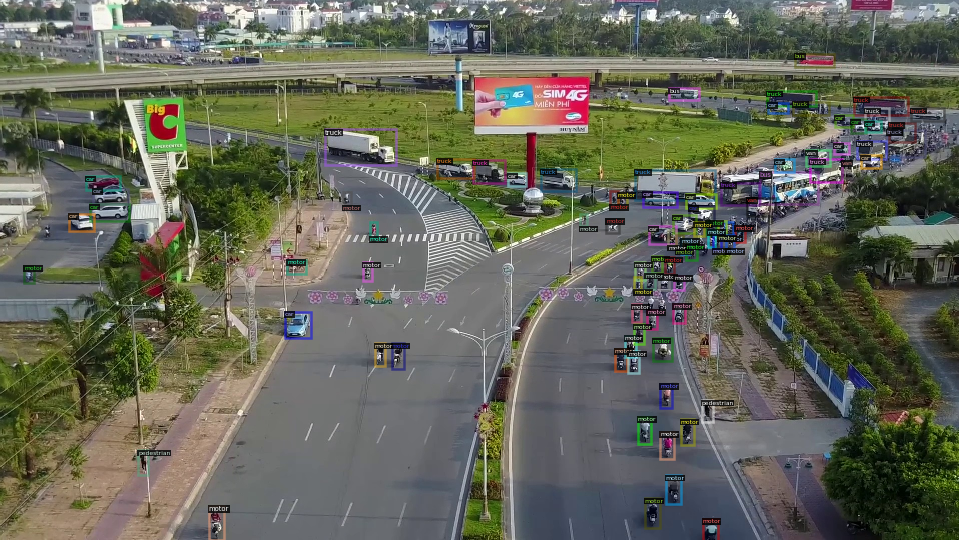

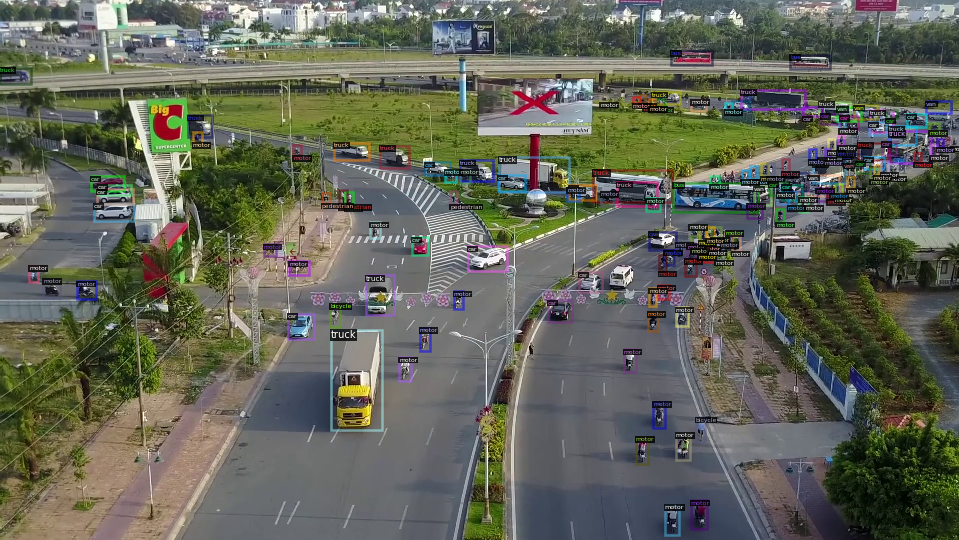

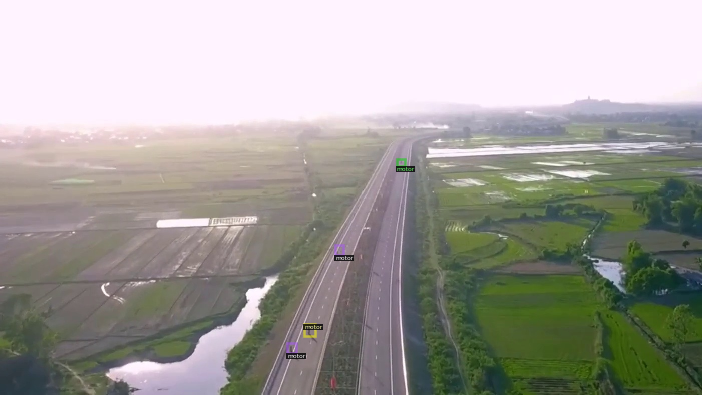

In [5]:
dataset_dicts = get_traffic_dicts('/content/Dataset/Train/')
for d in random.sample(dataset_dicts,3):
  img = cv2.imread(d['file_name'])
  visualizer = Visualizer(img[ :, :, ::-1], metadata=traffic_metadata,scale=0.5)
  vis = visualizer.draw_dataset_dict(d)
  cv2_imshow(vis.get_image()[:,:,::-1])

In [6]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [7]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("traffic_Train",)
cfg.DATASETS.TEST = ("traffic_Test",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url('COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml')
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.0125
cfg.SOLVER.MAX_ITER = 1500
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 9
cfg.TEST.EVAL_PERIOD = 500

os.makedirs(cfg.OUTPUT_DIR,exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[12/11 07:53:55 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:07, 21.6MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (10, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (10,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (36, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (36,) in the model! You might want to double check if this is expected.


[12/11 07:54:09 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.6/dist-packages/detectron2/modeling/roi_heads/fast_rcnn.py:217: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  num_fg = fg_inds.nonzero().numel()


[12/11 07:54:29 d2.utils.events]:  eta: 0:25:16  iter: 19  total_loss: 2.887  loss_cls: 1.919  loss_box_reg: 0.3467  loss_rpn_cls: 0.3297  loss_rpn_loc: 0.3719  time: 1.0101  data_time: 0.0481  lr: 0.00024976  max_mem: 5129M
[12/11 07:54:50 d2.utils.events]:  eta: 0:25:05  iter: 39  total_loss: 1.764  loss_cls: 0.83  loss_box_reg: 0.4226  loss_rpn_cls: 0.1869  loss_rpn_loc: 0.3112  time: 1.0276  data_time: 0.0095  lr: 0.00049951  max_mem: 5129M
[12/11 07:55:12 d2.utils.events]:  eta: 0:25:08  iter: 59  total_loss: 1.691  loss_cls: 0.6929  loss_box_reg: 0.5023  loss_rpn_cls: 0.1767  loss_rpn_loc: 0.3169  time: 1.0421  data_time: 0.0108  lr: 0.00074926  max_mem: 5129M
[12/11 07:55:34 d2.utils.events]:  eta: 0:25:11  iter: 79  total_loss: 1.622  loss_cls: 0.6201  loss_box_reg: 0.5516  loss_rpn_cls: 0.1391  loss_rpn_loc: 0.2919  time: 1.0595  data_time: 0.0108  lr: 0.00099901  max_mem: 5271M
[12/11 07:55:56 d2.utils.events]:  eta: 0:25:11  iter: 99  total_loss: 1.467  loss_cls: 0.5277  los

In [8]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [9]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8  # set the testing threshold for this model
cfg.DATASETS.TEST = ("traffic_Test", )
predictor = DefaultPredictor(cfg)

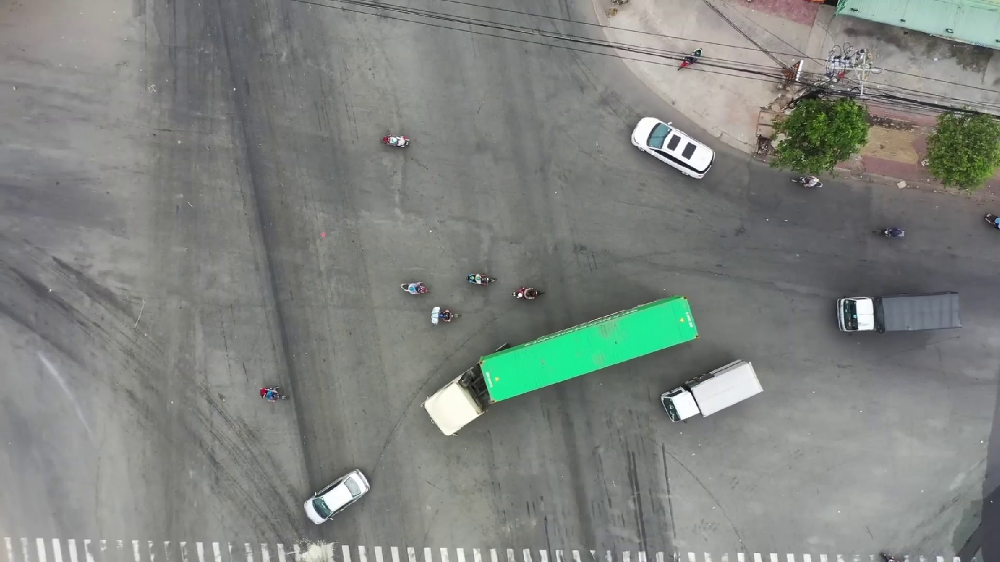

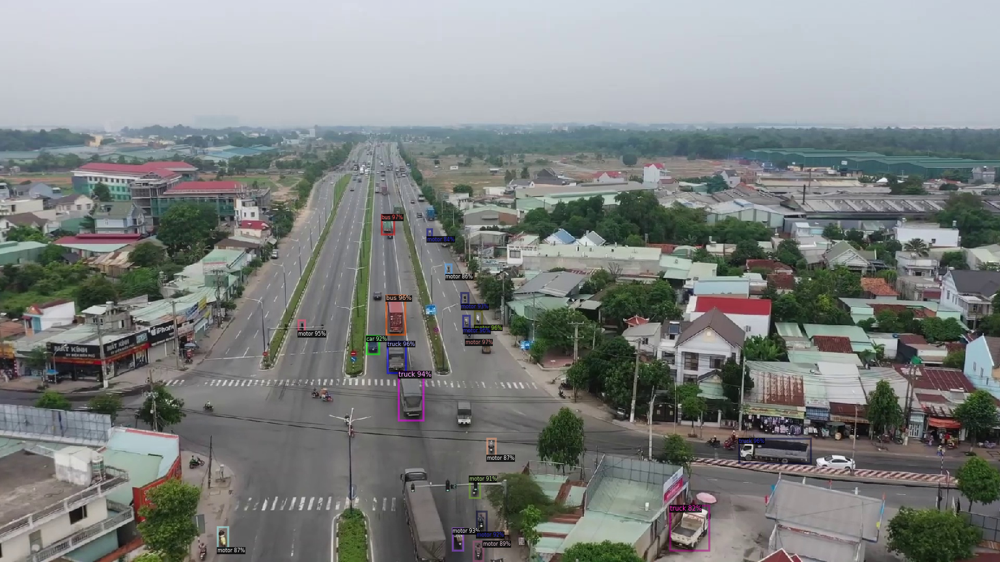

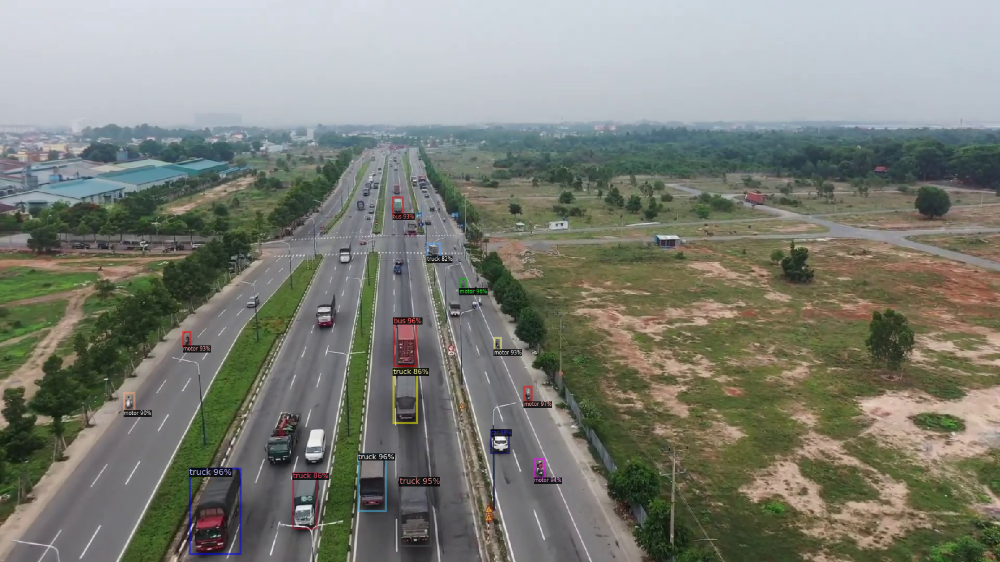

In [12]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_traffic_dicts("/content/Dataset/Test")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=traffic_metadata, 
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

In [13]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("traffic_Test", cfg, False, output_dir="/output/")
test_loader = build_detection_test_loader(cfg, "traffic_Test")
inference_on_dataset(predictor.model, test_loader, evaluator)
# another equivalent way is to use trainer.test

WARNING [12/11 08:32:54 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass tasks in directly
[12/11 08:32:54 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/11 08:32:54 d2.data.common]: Serializing 327 elements to byte tensors and concatenating them all ...
[12/11 08:32:54 d2.data.common]: Serialized dataset takes 0.69 MiB
[12/11 08:32:54 d2.evaluation.evaluator]: Start inference on 327 images
[12/11 08:32:56 d2.evaluation.evaluator]: Inference done 11/327. 0.1244 s / img. ETA=0:00:40
[12/11 08:33:01 d2.evaluation.evaluator]: Inference done 52/327. 0.1206 s / img. ETA=0:00:34
[12/11 08:33:06 d2.evaluation.evaluator]: Inference done 93/327. 0.1203 s / img. ETA=0:00:29
[12/11 08:33:11 d2.evaluation.evaluator]: Inference done 132/327. 0.1216 s / img. ETA=0:00:24
[12/11 08:33:16 d2.evaluation.evaluator]: Infer

OrderedDict([('bbox',
              {'AP': 8.328711828118559,
               'AP-bicycle': 0.0,
               'AP-bus': 28.923554434748766,
               'AP-car': 21.958421027188116,
               'AP-motor': 10.662236190789404,
               'AP-other': 0.0,
               'AP-pedestrian': 0.0,
               'AP-tricycle': 0.0,
               'AP-truck': 13.414194800340756,
               'AP-van': 0.0,
               'AP50': 14.671607003983345,
               'AP75': 8.661151433316636,
               'APl': 20.115832460109054,
               'APm': 10.297766060696487,
               'APs': 3.1537509041785587})])